# Logistic Regression — Second Small Grid Search

This notebook uses the **same HOG feature input and assignment-test input as the current KNN notebook**.

The first Logistic Regression grid search already found:

- Best `C = 0.1`
- Penalty = `L2`
- Solver = `lbfgs`
- Class weight = `balanced`

Therefore, this notebook performs a **small second-stage Grid Search only around `C = 0.1`**:

`[0.02, 0.05, 0.1, 0.2, 0.5]`

The other best hyperparameters are fixed:

- Penalty = L2
- Solver = L-BFGS
- Class weight = balanced

With 2-fold Stratified CV, this requires only:

**5 C values × 2 folds = 10 fits**

This notebook also follows the **same input and output flow as the KNN notebook**, including the assignment-image runtime test, prediction table, original/segmented side-by-side visualization, confusion matrix, and display of all assignment test results.

All Logistic Regression evaluation metrics are retained:
**Accuracy, Macro Precision, Macro Recall, Macro F1, classification report, and confusion matrices.**


In [39]:
from pathlib import Path

import cv2
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import (
    GridSearchCV,
    StratifiedKFold
)

from sklearn.pipeline import Pipeline

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

import sys
from pathlib import Path as _Path

sys.path.insert(
    0,
    str(_Path("..").resolve())
)

from pipeline import labels as pipeline_labels
from pipeline import paths as pipeline_paths


## 1. Load Class Labels

In [40]:
# Use the same label-loading method as the KNN notebook.
# If labels.csv exists, the class names are loaded from it.

label_map = pipeline_labels.load_label_map()

print(
    "Number of class names:",
    len(label_map)
)

print(label_map)


Number of class names: 58
{0: 'Speed limit five kilometers per hour', 1: 'Speed limit fifteen kilometers per hour', 2: 'Speed limit thirty kilometers per hour', 3: 'Speed limit fourty kilometers per hour', 4: 'Speed limit fifty kilometers per hour', 5: 'Speed limit sixty kilometers per hour', 6: 'Speed limit seventy kilometers per hour', 7: 'Speed limit eighty kilometers per hour', 8: "Don't Go straight or left", 9: "Don't Go straight or Right", 10: "Don't Go straight", 11: "Don't Go Left", 12: "Don't Go Left or Right", 13: "Don't Go Right", 14: "Don't overtake from Left", 15: 'No U-turn', 16: 'No Car', 17: 'No horn', 18: 'End of Speed limit fouty kilometers per hour', 19: 'End of Speed limit fifty kilometers per hour', 20: 'Go straight or right', 21: 'Go straight', 22: 'Go Left', 23: 'Go Left or right', 24: 'Go Right', 25: 'keep Left', 26: 'keep Right', 27: 'Roundabout mandatory', 28: 'watch out for cars', 29: 'Horn', 30: 'Non-motor vehicle allowed', 31: 'Uturn allowed', 32: 'Watch fo

## 2. Load the Same HOG Features as KNN

In [41]:
FEATURE_DIR = pipeline_paths.FEATURE_DIR

TRAIN_FILE = (
    FEATURE_DIR
    / "chinese_traffic_signs_hog_features_train.npz"
)

TEST_FILE = (
    FEATURE_DIR
    / "chinese_traffic_signs_hog_features_test.npz"
)

train_data = np.load(TRAIN_FILE)
test_data = np.load(TEST_FILE)

X_train_full = train_data["X"]
y_train_full = train_data["y"]
train_filenames = train_data["filenames"]

X_test = test_data["X"]
y_test = test_data["y"]
test_filenames = test_data["filenames"]

print(
    "Training features:",
    X_train_full.shape
)

print(
    "Training labels:",
    y_train_full.shape
)

print(
    "Training filenames:",
    train_filenames.shape
)

print(
    "Testing features:",
    X_test.shape
)

print(
    "Testing labels:",
    y_test.shape
)

print(
    "Testing filenames:",
    test_filenames.shape
)


Training features: (4719, 1764)
Training labels: (4719,)
Training filenames: (4719,)
Testing features: (1177, 1764)
Testing labels: (1177,)
Testing filenames: (1177,)


## 3. Check Dataset

In [42]:
print(
    "Number of training samples:",
    len(X_train_full)
)

print(
    "Number of testing samples:",
    len(X_test)
)

print(
    "Number of classes:",
    len(np.unique(y_train_full))
)

print(
    "Classes:",
    np.unique(y_train_full)
)

print(
    "HOG features per image:",
    X_train_full.shape[1]
)


Number of training samples: 4719
Number of testing samples: 1177
Number of classes: 58
Classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57]
HOG features per image: 1764


In [43]:
print(
    "NaN in training:",
    np.isnan(X_train_full).any()
)

print(
    "NaN in testing:",
    np.isnan(X_test).any()
)

print(
    "Infinity in training:",
    np.isinf(X_train_full).any()
)

print(
    "Infinity in testing:",
    np.isinf(X_test).any()
)


NaN in training: False
NaN in testing: False
Infinity in training: False
Infinity in testing: False


### 3.1 Class Distribution and Imbalance

,Class ID,Class Name,Number of Samples
0,0,Speed limit five kilometers per hour,102
1,1,Speed limit fifteen kilometers per hour,40
2,2,Speed limit thirty kilometers per hour,82
3,3,Speed limit fourty kilometers per hour,254
4,4,Speed limit fifty kilometers per hour,124
5,5,Speed limit sixty kilometers per hour,194
6,6,Speed limit seventy kilometers per hour,86
7,7,Speed limit eighty kilometers per hour,161
8,8,Don't Go straight or left,17
9,9,Don't Go straight or Right,2


Largest class size : 409
Smallest class size: 2
Imbalance ratio    : 204.50:1


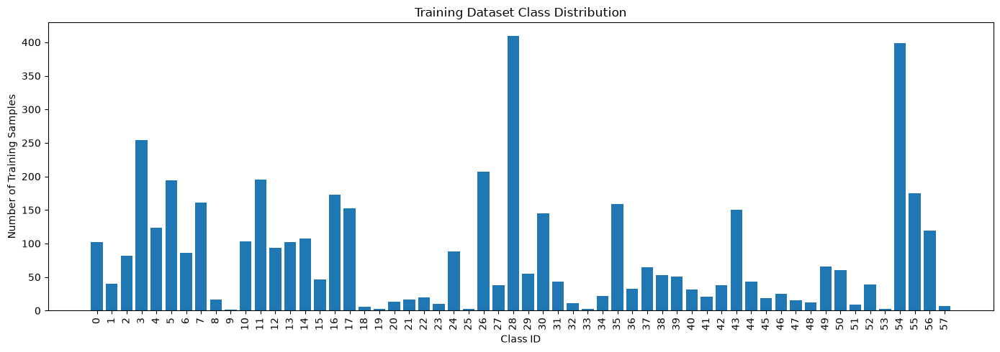

In [44]:
class_counts = (
    pd.Series(y_train_full)
    .value_counts()
    .sort_index()
)

class_distribution_df = pd.DataFrame({
    "Class ID":
        class_counts.index.astype(int),

    "Class Name": [
        label_map.get(
            int(class_id),
            f"Class {class_id}"
        )
        for class_id
        in class_counts.index
    ],

    "Number of Samples":
        class_counts.values
})

display(
    class_distribution_df
)

largest_class = int(
    class_counts.max()
)

smallest_class = int(
    class_counts.min()
)

imbalance_ratio = (
    largest_class
    / smallest_class
)

print(
    "Largest class size :",
    largest_class
)

print(
    "Smallest class size:",
    smallest_class
)

print(
    f"Imbalance ratio    : "
    f"{imbalance_ratio:.2f}:1"
)

plt.figure(
    figsize=(14, 5)
)

plt.bar(
    class_distribution_df[
        "Class ID"
    ].astype(str),
    class_distribution_df[
        "Number of Samples"
    ]
)

plt.xlabel(
    "Class ID"
)

plt.ylabel(
    "Number of Training Samples"
)

plt.title(
    "Training Dataset Class Distribution"
)

plt.xticks(
    rotation=90
)

plt.tight_layout()
plt.show()


## 4. 2-Fold Stratified Cross-Validation

In [45]:
cv = StratifiedKFold(
    n_splits=2,
    shuffle=True,
    random_state=42
)

print(
    "Training samples:",
    X_train_full.shape
)

print(
    "Final test samples:",
    X_test.shape
)

print(
    "Cross-validation: "
    "2-fold StratifiedKFold"
)


Training samples: (4719, 1764)
Final test samples: (1177, 1764)
Cross-validation: 2-fold StratifiedKFold


## 5. Logistic Regression Pipeline

In [46]:
# The first broad Grid Search already selected:
# penalty = L2
# solver = lbfgs
# class_weight = balanced
#
# L2 is LogisticRegression's default penalty, so it does not need to be
# written explicitly here.

logistic_pipeline = Pipeline([
    (
        "scaler",
        StandardScaler()
    ),
    (
        "logistic",
        LogisticRegression(
            solver="lbfgs",
            class_weight="balanced",
            max_iter=5000,
            random_state=42
        )
    )
])

print(
    "Logistic Regression pipeline created."
)


Logistic Regression pipeline created.


## 6. Second Small Grid Search Around `C = 0.1`

The first broad search identified `C = 0.1` as the best value.  
The second search now checks nearby values while keeping the previously selected penalty, solver, and class weight fixed.


In [47]:
second_C_values = [0.02,0.05,0.1,0.2,0.5,0.7,0.9]

second_param_grid = {
    "logistic__C":
        second_C_values
}

second_grid_search = GridSearchCV(
    estimator=logistic_pipeline,
    param_grid=second_param_grid,
    scoring="f1_macro",
    cv=cv,
    n_jobs=-1,
    verbose=1,
    return_train_score=True,
    refit=True
)

second_grid_search.fit(
    X_train_full,
    y_train_full
)

print(
    "Second Grid Search completed."
)

print(
    "Number of candidates:",
    len(second_C_values)
)

print(
    "Total CV fits:",
    len(second_C_values) * 2
)


Fitting 2 folds for each of 7 candidates, totalling 14 fits
Second Grid Search completed.
Number of candidates: 7
Total CV fits: 14


## 7. Second Grid Search Results

In [48]:
second_results_df = pd.DataFrame(
    second_grid_search.cv_results_
)

second_results_df = second_results_df[[
    "param_logistic__C",
    "mean_test_score",
    "std_test_score",
    "mean_train_score",
    "rank_test_score",
    "mean_fit_time"
]]

second_results_df = (
    second_results_df.rename(
        columns={
            "param_logistic__C":
                "C",

            "mean_test_score":
                "Mean CV Macro F1",

            "std_test_score":
                "CV F1 Std",

            "mean_train_score":
                "Mean Train Macro F1",

            "rank_test_score":
                "Rank",

            "mean_fit_time":
                "Mean Fit Time (s)"
        }
    )
    .sort_values(
        by="Rank"
    )
    .reset_index(
        drop=True
    )
)

display(
    second_results_df
)


,C,Mean CV Macro F1,CV F1 Std,Mean Train Macro F1,Rank,Mean Fit Time (s)
0,0.50,0.941441,0.005396,1.0,1,2.946864
1,0.20,0.941313,0.006067,1.0,2,3.358268
2,0.90,0.941014,0.005775,1.0,3,3.078481
3,0.05,0.939690,0.003716,1.0,4,4.638508
4,0.70,0.939121,0.003570,1.0,5,3.165541
5,0.10,0.938704,0.004095,1.0,6,3.757118
6,0.02,0.937326,0.004272,1.0,7,4.826882


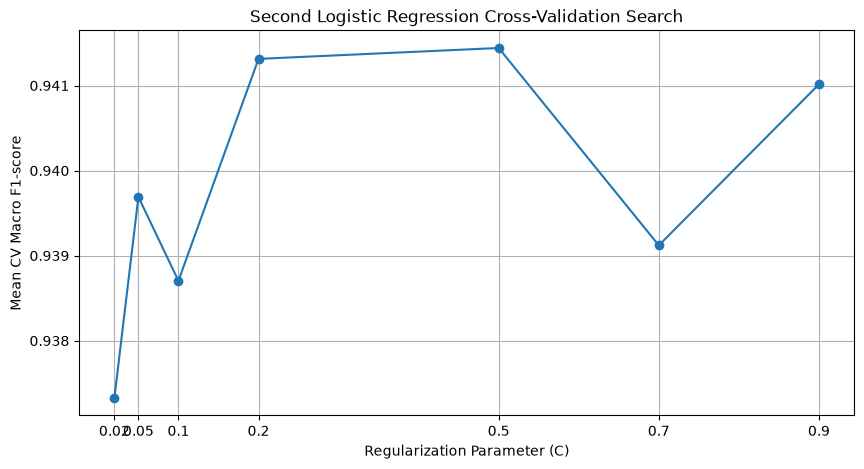

In [49]:
plot_results = (
    second_results_df
    .sort_values(
        by="C"
    )
)

plt.figure(
    figsize=(10, 5)
)

plt.plot(
    plot_results["C"],
    plot_results[
        "Mean CV Macro F1"
    ],
    marker="o"
)

plt.xlabel(
    "Regularization Parameter (C)"
)

plt.ylabel(
    "Mean CV Macro F1-score"
)

plt.title(
    "Second Logistic Regression "
    "Cross-Validation Search"
)

plt.xticks(
    second_C_values,
    second_C_values
)

plt.grid()
plt.show()


## 8. Best Second-Search Configuration

In [50]:
best_parameters = (
    second_grid_search.best_params_
)

best_C = float(
    best_parameters[
        "logistic__C"
    ]
)

best_penalty = "l2"
best_solver = "lbfgs"
best_class_weight = "balanced"

best_cv_f1 = (
    second_grid_search.best_score_
)

print(
    "Best Logistic Regression Configuration"
)

print(
    "--------------------------------------"
)

print(
    "Best C:",
    best_C
)

print(
    "Penalty:",
    best_penalty
)

print(
    "Solver:",
    best_solver
)

print(
    "Class Weight:",
    best_class_weight
)

print(
    f"Best Mean CV Macro F1: "
    f"{best_cv_f1:.4f}"
)


Best Logistic Regression Configuration
--------------------------------------
Best C: 0.5
Penalty: l2
Solver: lbfgs
Class Weight: balanced
Best Mean CV Macro F1: 0.9414


## 9. Train the Final Logistic Regression Model

In [51]:
final_scaler = StandardScaler()

X_train_full_scaled = (
    final_scaler.fit_transform(
        X_train_full
    )
)

X_test_final_scaled = (
    final_scaler.transform(
        X_test
    )
)


In [52]:
final_logistic = LogisticRegression(
    C=best_C,
    solver="lbfgs",
    class_weight="balanced",
    max_iter=5000,
    random_state=42
)

final_logistic.fit(
    X_train_full_scaled,
    y_train_full
)

y_train_pred = (
    final_logistic.predict(
        X_train_full_scaled
    )
)

print(
    "Final Logistic Regression Model"
)

print(
    "-------------------------------"
)

print(
    f"C            : {best_C}"
)

print(
    f"Penalty      : {best_penalty}"
)

print(
    f"Solver       : {best_solver}"
)

print(
    f"Class Weight : {best_class_weight}"
)

print(
    "Iterations used:",
    final_logistic.n_iter_
)


Final Logistic Regression Model
-------------------------------
C            : 0.5
Penalty      : l2
Solver       : lbfgs
Class Weight : balanced
Iterations used: [20]


## 10. Logistic Regression Training Metrics

In [53]:
train_accuracy = accuracy_score(
    y_train_full,
    y_train_pred
)

train_precision = precision_score(
    y_train_full,
    y_train_pred,
    average="macro",
    zero_division=0
)

train_recall = recall_score(
    y_train_full,
    y_train_pred,
    average="macro",
    zero_division=0
)

train_f1 = f1_score(
    y_train_full,
    y_train_pred,
    average="macro",
    zero_division=0
)

print(
    "Logistic Regression Training Results"
)

print(
    "------------------------------------"
)

print(
    f"Accuracy  : {train_accuracy:.4f}"
)

print(
    f"Precision : {train_precision:.4f}"
)

print(
    f"Recall    : {train_recall:.4f}"
)

print(
    f"F1-score  : {train_f1:.4f}"
)


Logistic Regression Training Results
------------------------------------
Accuracy  : 1.0000
Precision : 1.0000
Recall    : 1.0000
F1-score  : 1.0000


## 11. Locate Original Dataset Images

In [54]:
DATASET_DIR = Path(
    "../data/chinese_traffic_signs"
)

IMAGE_EXTENSIONS = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".ppm"
}

all_images = [
    p
    for p
    in DATASET_DIR.rglob("*")
    if (
        p.is_file()
        and p.suffix.lower()
        in IMAGE_EXTENSIONS
    )
]

image_lookup = {
    p.name: p
    for p
    in all_images
}

print(
    "Images found:",
    len(image_lookup)
)


Images found: 5998


## 12. Visualize 10 Training Predictions

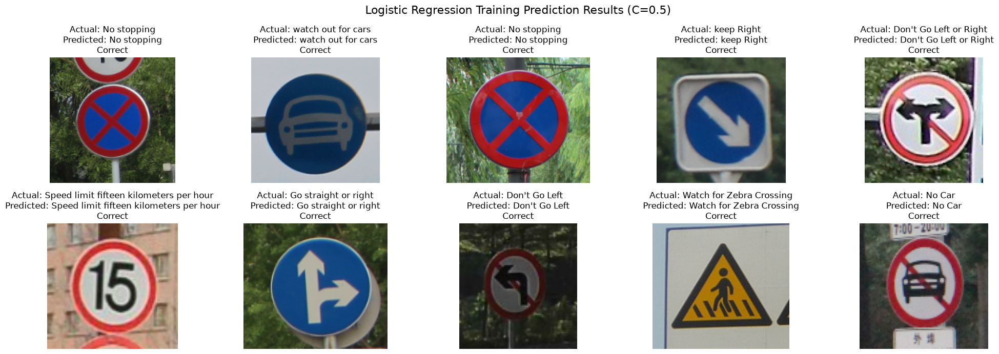

In [55]:
sample_count = min(
    10,
    len(y_train_full)
)

sample_indices = np.linspace(
    0,
    len(y_train_full) - 1,
    sample_count,
    dtype=int
)

fig, axes = plt.subplots(
    2,
    5,
    figsize=(20, 7)
)

axes = axes.flatten()

for ax, index in zip(
    axes,
    sample_indices
):

    filename = str(
        train_filenames[index]
    )

    actual = int(
        y_train_full[index]
    )

    predicted = int(
        y_train_pred[index]
    )

    image_path = (
        image_lookup.get(
            filename
        )
    )

    if image_path is not None:

        image = Image.open(
            image_path
        ).convert("RGB")

        ax.imshow(image)

    correct = (
        actual == predicted
    )

    ax.set_title(
        f"Actual: "
        f"{label_map.get(actual, actual)}\n"
        f"Predicted: "
        f"{label_map.get(predicted, predicted)}\n"
        f"{'Correct' if correct else 'Wrong'}"
    )

    ax.axis("off")

plt.suptitle(
    f"Logistic Regression "
    f"Training Prediction Results "
    f"(C={best_C})",
    fontsize=16
)

plt.tight_layout()
plt.show()


## 13. Test on the Public Dataset Test Set

In [56]:
y_test_pred = (
    final_logistic.predict(
        X_test_final_scaled
    )
)


In [57]:
test_accuracy = accuracy_score(
    y_test,
    y_test_pred
)

test_precision = precision_score(
    y_test,
    y_test_pred,
    average="macro",
    zero_division=0
)

test_recall = recall_score(
    y_test,
    y_test_pred,
    average="macro",
    zero_division=0
)

test_f1 = f1_score(
    y_test,
    y_test_pred,
    average="macro",
    zero_division=0
)

print(
    "Logistic Regression Final Test Results"
)

print(
    "--------------------------------------"
)

print(
    f"Best C            : {best_C}"
)

print(
    f"Best penalty      : {best_penalty}"
)

print(
    f"Best solver       : {best_solver}"
)

print(
    f"Best class weight : "
    f"{best_class_weight}"
)

print(
    f"Accuracy          : "
    f"{test_accuracy:.4f}"
)

print(
    f"Precision (Macro) : "
    f"{test_precision:.4f}"
)

print(
    f"Recall (Macro)    : "
    f"{test_recall:.4f}"
)

print(
    f"F1-score (Macro)  : "
    f"{test_f1:.4f}"
)


Logistic Regression Final Test Results
--------------------------------------
Best C            : 0.5
Best penalty      : l2
Best solver       : lbfgs
Best class weight : balanced
Accuracy          : 0.9898
Precision (Macro) : 0.9943
Recall (Macro)    : 0.9928
F1-score (Macro)  : 0.9933


In [58]:
print(
    classification_report(
        y_test,
        y_test_pred,
        zero_division=0
    )
)


              precision    recall  f1-score   support

           0       0.92      0.92      0.92        26
           1       1.00      1.00      1.00        10
           2       1.00      1.00      1.00        20
           3       1.00      1.00      1.00        63
           4       1.00      0.94      0.97        31
           5       0.96      0.96      0.96        48
           6       1.00      1.00      1.00        22
           7       1.00      1.00      1.00        40
           8       1.00      1.00      1.00         4
          10       1.00      1.00      1.00        26
          11       0.96      1.00      0.98        49
          12       1.00      1.00      1.00        23
          13       0.92      1.00      0.96        23
          14       1.00      1.00      1.00        28
          15       1.00      1.00      1.00        11
          16       1.00      0.95      0.98        42
          17       1.00      1.00      1.00        38
          18       1.00    

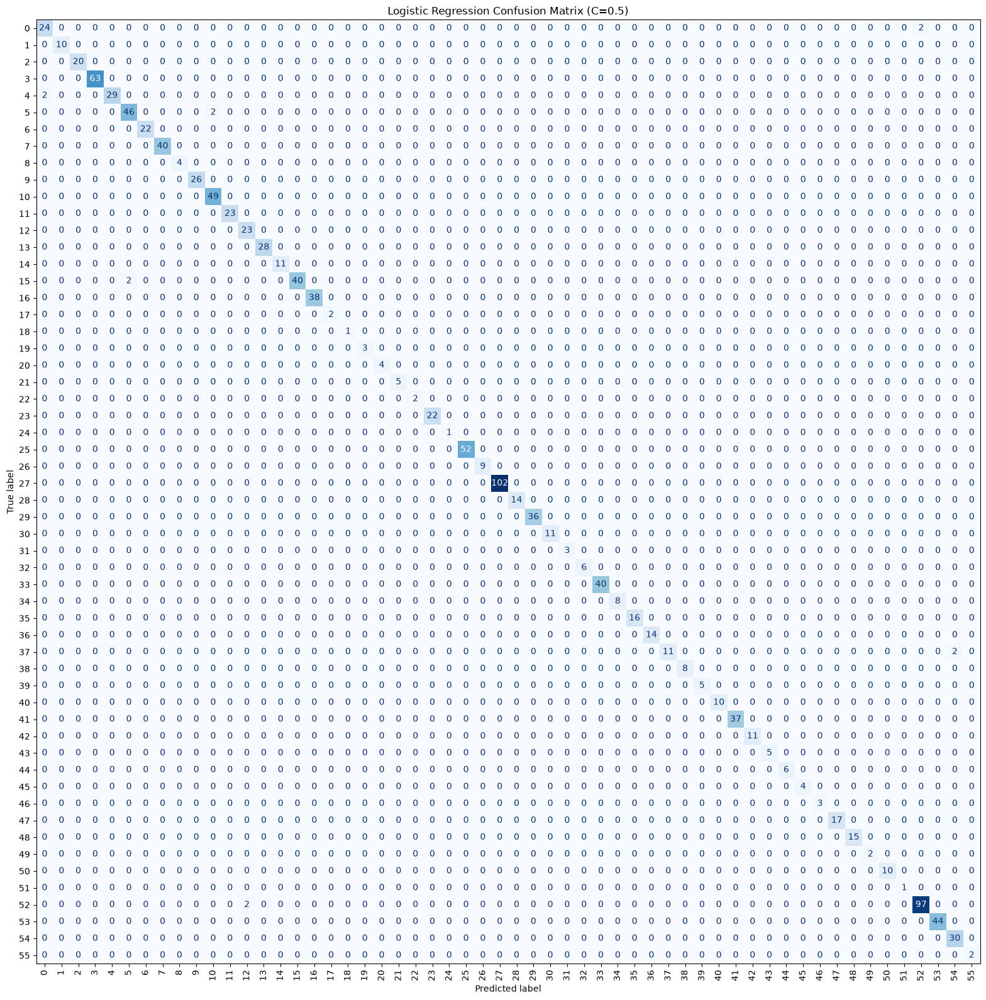

In [59]:
cm = confusion_matrix(
    y_test,
    y_test_pred
)

fig, ax = plt.subplots(
    figsize=(16, 16)
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

plt.title(
    f"Logistic Regression "
    f"Confusion Matrix (C={best_C})"
)

plt.tight_layout()
plt.show()


In [60]:
sample_count = min(
    10,
    len(y_test)
)

sample_indices = np.linspace(
    0,
    len(y_test) - 1,
    sample_count,
    dtype=int
)

prediction_results = []

for index in sample_indices:

    actual = int(
        y_test[index]
    )

    predicted = int(
        y_test_pred[index]
    )

    prediction_results.append({
        "Test Index":
            index,

        "Actual Class":
            actual,

        "Predicted Class":
            predicted,

        "Correct":
            actual == predicted
    })

prediction_df = pd.DataFrame(
    prediction_results
)

display(
    prediction_df
)


,Test Index,Actual Class,Predicted Class,Correct
0,0,54,54,True
1,130,29,29,True
2,261,10,10,True
3,392,55,55,True
4,522,55,55,True
5,653,11,11,True
6,784,16,16,True
7,914,10,10,True
8,1045,16,16,True
9,1176,3,3,True


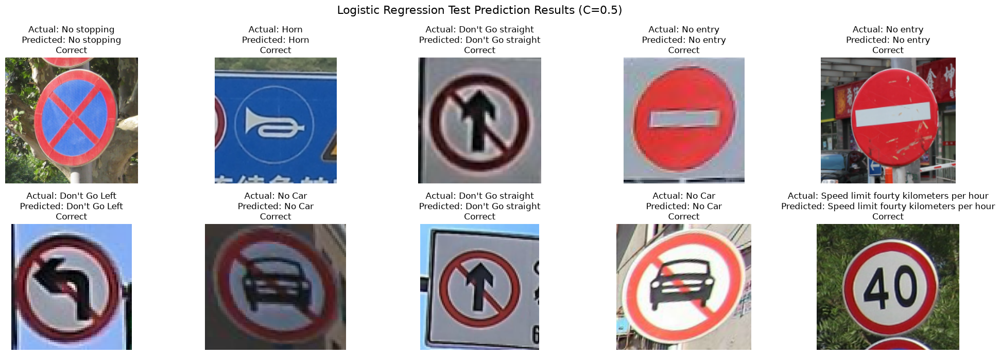

In [61]:
sample_count = min(
    10,
    len(y_test)
)

sample_indices = np.linspace(
    0,
    len(y_test) - 1,
    sample_count,
    dtype=int
)

fig, axes = plt.subplots(
    2,
    5,
    figsize=(20, 7)
)

axes = axes.flatten()

for ax, index in zip(
    axes,
    sample_indices
):

    filename = str(
        test_filenames[index]
    )

    actual = int(
        y_test[index]
    )

    predicted = int(
        y_test_pred[index]
    )

    image_path = (
        image_lookup.get(
            filename
        )
    )

    if image_path is not None:

        image = Image.open(
            image_path
        ).convert("RGB")

        ax.imshow(image)

    correct = (
        actual == predicted
    )

    ax.set_title(
        f"Actual: "
        f"{label_map.get(actual, actual)}\n"
        f"Predicted: "
        f"{label_map.get(predicted, predicted)}\n"
        f"{'Correct' if correct else 'Wrong'}"
    )

    ax.axis("off")

plt.suptitle(
    f"Logistic Regression "
    f"Test Prediction Results "
    f"(C={best_C})",
    fontsize=16
)

plt.tight_layout()
plt.show()


## 14. Original + Segmented Prediction Visualization

The following functions are copied from the KNN output flow so the Logistic Regression notebook displays the assignment results in the same format.


In [62]:
from pipeline import (
    preprocessing
    as pipeline_preprocessing
)


def get_segmented_image(
    image_path
):
    # Uses the same ROI/segmentation routine
    # that produced the HOG features.

    image_bgr = cv2.imread(
        str(image_path)
    )

    original_rgb = cv2.cvtColor(
        image_bgr,
        cv2.COLOR_BGR2RGB
    )

    roi = (
        pipeline_preprocessing
        .get_roi(
            original_rgb
        )
    )

    segmented_rgb = (
        original_rgb
        if roi is None
        else roi[0]
    )

    return (
        original_rgb,
        segmented_rgb
    )


In [63]:
def display_prediction_results(
    filenames,
    y_true,
    y_pred,
    image_lookup,
    title
):

    sample_indices = np.linspace(
        0,
        len(filenames) - 1,
        10,
        dtype=int
    )

    fig, axes = plt.subplots(
        10,
        2,
        figsize=(10, 36)
    )

    for row, index in enumerate(
        sample_indices
    ):

        filename = Path(
            str(filenames[index])
        ).name

        image_path = (
            image_lookup.get(
                filename
            )
        )

        actual = int(
            y_true[index]
        )

        predicted = int(
            y_pred[index]
        )

        if image_path is None:
            continue

        original, segmented = (
            get_segmented_image(
                image_path
            )
        )

        axes[
            row,
            0
        ].imshow(
            original
        )

        axes[
            row,
            0
        ].set_title(
            f"Original - {filename}"
        )

        axes[
            row,
            0
        ].axis("off")

        axes[
            row,
            1
        ].imshow(
            segmented
        )

        axes[
            row,
            1
        ].set_title(
            f"Actual: "
            f"{label_map.get(actual, actual)}\n"
            f"Predicted: "
            f"{label_map.get(predicted, predicted)}\n"
            f"{'Correct' if actual == predicted else 'Wrong'}"
        )

        axes[
            row,
            1
        ].axis("off")

    plt.suptitle(
        title,
        fontsize=16,
        y=0.995
    )

    plt.subplots_adjust(
        top=0.96,
        bottom=0.02,
        hspace=0.65,
        wspace=0.25
    )

    plt.show()


## 15. Test on the 84 Assignment Images

In [64]:
assignment_data = np.load(
    "../features/"
    "assignment1_test_hog_features.npz"
)

X_assignment_test = (
    assignment_data["X"]
)

# Same key used by the KNN notebook
assignment_image_paths = (
    assignment_data["filenames"]
)

# Use labels saved by the feature-extraction
# pipeline rather than guessing them from
# the filename.
y_assignment_test = (
    assignment_data["y"]
)

print(
    "Assignment test features:",
    X_assignment_test.shape
)

print(
    "Assignment filenames:",
    assignment_image_paths.shape
)

print(
    "Assignment labels:",
    y_assignment_test.shape
)


Assignment test features: (84, 1764)
Assignment filenames: (84,)
Assignment labels: (84,)


In [65]:
X_assignment_test_scaled = (
    final_scaler.transform(
        X_assignment_test
    )
)

print(
    "Scaled Assignment test shape:",
    X_assignment_test_scaled.shape
)


Scaled Assignment test shape: (84, 1764)


### 15.1 Classification Runtime

In [66]:
y_assignment_pred = []
classification_times = []

for i in range(
    len(X_assignment_test_scaled)
):

    X_one = (
        X_assignment_test_scaled[
            i:i + 1
        ]
    )

    start_time = (
        time.perf_counter()
    )

    prediction = (
        final_logistic.predict(
            X_one
        )[0]
    )

    end_time = (
        time.perf_counter()
    )

    runtime = (
        end_time
        - start_time
    )

    y_assignment_pred.append(
        prediction
    )

    classification_times.append(
        runtime
    )

y_assignment_pred = np.array(
    y_assignment_pred
)

classification_times = np.array(
    classification_times
)


In [67]:
print(
    "Logistic Regression "
    "Classification Runtime"
)

print(
    "------------------------------"
)

print(
    f"Average time per image : "
    f"{classification_times.mean():.6f} seconds"
)

print(
    f"Maximum time per image : "
    f"{classification_times.max():.6f} seconds"
)

print(
    f"Minimum time per image : "
    f"{classification_times.min():.6f} seconds"
)

print(
    f"All images below 2 sec : "
    f"{np.all(classification_times < 2)}"
)


Logistic Regression Classification Runtime
------------------------------
Average time per image : 0.000293 seconds
Maximum time per image : 0.000604 seconds
Minimum time per image : 0.000176 seconds
All images below 2 sec : True


In [68]:
print(
    "Number of predictions:",
    len(y_assignment_pred)
)

print(
    "First 10 predictions:",
    y_assignment_pred[:10]
)

print(
    "Actual labels:",
    y_assignment_test.shape
)

print(
    "First 10 actual labels:",
    y_assignment_test[:10]
)


Number of predictions: 84
First 10 predictions: [ 1  2  5 20 20 20 21 21 27 31]
Actual labels: (84,)
First 10 actual labels: [ 1  2  5 20 20 20 21 21 27 31]


### 15.2 Assignment Test Metrics

In [69]:
assignment_accuracy = accuracy_score(
    y_assignment_test,
    y_assignment_pred
)

assignment_precision = precision_score(
    y_assignment_test,
    y_assignment_pred,
    average="macro",
    zero_division=0
)

assignment_recall = recall_score(
    y_assignment_test,
    y_assignment_pred,
    average="macro",
    zero_division=0
)

assignment_f1 = f1_score(
    y_assignment_test,
    y_assignment_pred,
    average="macro",
    zero_division=0
)

print(
    "Logistic Regression Results "
    "on 84 Assignment Test Images"
)

print(
    "-----------------------------------------"
)

print(
    f"Accuracy  : "
    f"{assignment_accuracy:.4f}"
)

print(
    f"Precision : "
    f"{assignment_precision:.4f}"
)

print(
    f"Recall    : "
    f"{assignment_recall:.4f}"
)

print(
    f"F1-score  : "
    f"{assignment_f1:.4f}"
)


Logistic Regression Results on 84 Assignment Test Images
-----------------------------------------
Accuracy  : 1.0000
Precision : 1.0000
Recall    : 1.0000
F1-score  : 1.0000


### 15.3 Full Assignment Prediction Table

In [70]:
assignment_results = []

for (
    image_path,
    actual,
    predicted
) in zip(
    assignment_image_paths,
    y_assignment_test,
    y_assignment_pred
):

    actual = int(actual)
    predicted = int(predicted)

    assignment_results.append({

        "Filename":
            Path(
                str(image_path)
            ).name,

        "Actual Class":
            actual,

        "Actual Sign":
            label_map.get(
                actual,
                f"Class {actual}"
            ),

        "Predicted Class":
            predicted,

        "Predicted Sign":
            label_map.get(
                predicted,
                f"Class {predicted}"
            ),

        "Correct":
            actual == predicted
    })

assignment_results_df = (
    pd.DataFrame(
        assignment_results
    )
)

display(
    assignment_results_df
)


,Filename,Actual Class,Actual Sign,Predicted Class,Predicted Sign,Correct
0,001_0004.png,1,Speed limit fifteen kilometers per hour,1,Speed limit fifteen kilometers per hour,True
1,002_0036.png,2,Speed limit thirty kilometers per hour,2,Speed limit thirty kilometers per hour,True
2,005_0030.png,5,Speed limit sixty kilometers per hour,5,Speed limit sixty kilometers per hour,True
3,020_0003.png,20,Go straight or right,20,Go straight or right,True
4,020_0004.png,20,Go straight or right,20,Go straight or right,True
...,...,...,...,...,...,...
79,029_1_0015.png,29,Horn,29,Horn,True
80,031_1_0020.png,31,Uturn allowed,31,Uturn allowed,True
81,036_1_0014.png,36,Watch for non-motor vehicle,36,Watch for non-motor vehicle,True
82,036_1_0016.png,36,Watch for non-motor vehicle,36,Watch for non-motor vehicle,True


In [71]:
from pipeline import (
    annotations
    as pipeline_annotations
)

assignment_images = (
    pipeline_annotations
    .list_dataset_images()
)

assignment_image_lookup = {
    p.name: p
    for p
    in assignment_images
}

print(
    "Dataset images available "
    "for visualisation:",
    len(assignment_images)
)


Dataset images available for visualisation: 5998


### 15.4 Visualize 10 Assignment Predictions

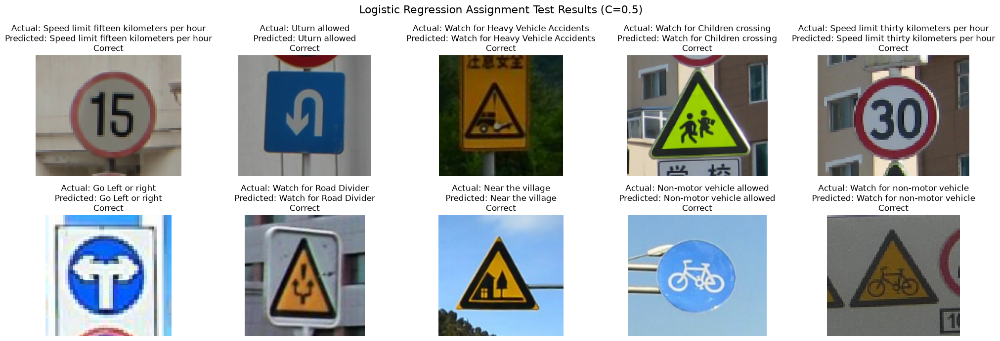

In [72]:
sample_count = min(
    10,
    len(assignment_image_paths)
)

sample_indices = np.linspace(
    0,
    len(assignment_image_paths) - 1,
    sample_count,
    dtype=int
)

fig, axes = plt.subplots(
    2,
    5,
    figsize=(20, 7)
)

axes = axes.flatten()

for ax, index in zip(
    axes,
    sample_indices
):

    filename = Path(
        str(
            assignment_image_paths[
                index
            ]
        )
    ).name

    actual = int(
        y_assignment_test[index]
    )

    predicted = int(
        y_assignment_pred[index]
    )

    image_path = (
        assignment_image_lookup.get(
            filename
        )
    )

    if image_path is not None:

        image = Image.open(
            image_path
        ).convert("RGB")

        ax.imshow(image)

    correct = (
        actual == predicted
    )

    ax.set_title(
        f"Actual: "
        f"{label_map.get(actual, actual)}\n"
        f"Predicted: "
        f"{label_map.get(predicted, predicted)}\n"
        f"{'Correct' if correct else 'Wrong'}"
    )

    ax.axis("off")

plt.suptitle(
    f"Logistic Regression "
    f"Assignment Test Results "
    f"(C={best_C})",
    fontsize=16
)

plt.tight_layout()
plt.show()


### 15.5 Original vs Segmented — 10 Assignment Images

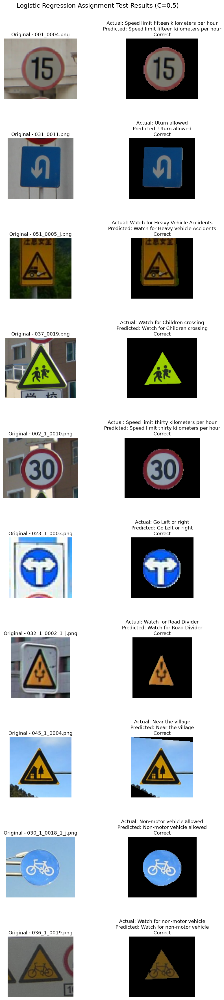

In [73]:
display_prediction_results(
    assignment_image_paths,
    y_assignment_test,
    y_assignment_pred,
    assignment_image_lookup,
    (
        "Logistic Regression "
        "Assignment Test Results "
        f"(C={best_C})"
    )
)


### 15.6 Assignment Confusion Matrix

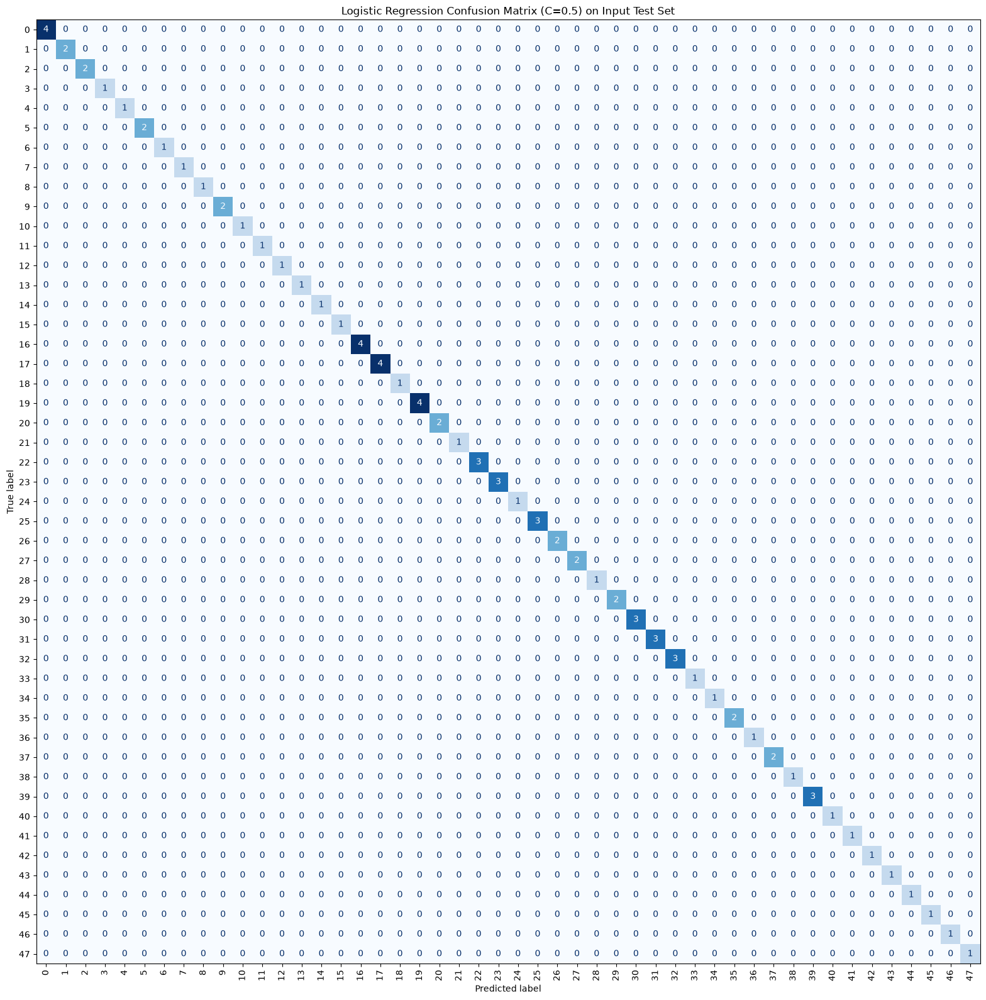

In [74]:
cm_assignment = confusion_matrix(
    y_assignment_test,
    y_assignment_pred
)

fig, ax = plt.subplots(
    figsize=(16, 16)
)

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm_assignment
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    colorbar=False
)

plt.title(
    f"Logistic Regression "
    f"Confusion Matrix "
    f"(C={best_C}) "
    f"on Input Test Set"
)

plt.tight_layout()
plt.show()


### 15.7 Display ALL Assignment Test Results

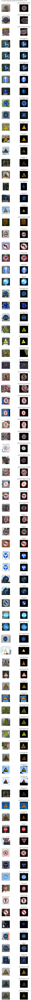

In [75]:
total_results = len(
    assignment_image_paths
)

fig, axes = plt.subplots(
    total_results,
    2,
    figsize=(
        10,
        2.8 * total_results
    ),
    squeeze=False
)

for row, index in enumerate(
    range(total_results)
):

    filename = Path(
        str(
            assignment_image_paths[
                index
            ]
        )
    ).name

    actual = int(
        y_assignment_test[index]
    )

    predicted = int(
        y_assignment_pred[index]
    )

    correct = (
        actual == predicted
    )

    image_path = (
        assignment_image_lookup.get(
            filename
        )
    )

    if image_path is None:

        axes[
            row,
            0
        ].axis("off")

        axes[
            row,
            1
        ].axis("off")

        continue

    original, segmented = (
        get_segmented_image(
            image_path
        )
    )

    axes[
        row,
        0
    ].imshow(
        original
    )

    axes[
        row,
        0
    ].set_title(
        f"Original - {filename}",
        fontsize=9
    )

    axes[
        row,
        0
    ].axis("off")

    axes[
        row,
        1
    ].imshow(
        segmented
    )

    axes[
        row,
        1
    ].set_title(
        f"Actual: "
        f"{label_map.get(actual, actual)}\n"
        f"Predicted: "
        f"{label_map.get(predicted, predicted)}\n"
        f"{'Correct' if correct else 'Wrong'}",
        fontsize=9
    )

    axes[
        row,
        1
    ].axis("off")

plt.suptitle(
    f"All Logistic Regression "
    f"Assignment Test Results "
    f"(C={best_C})",
    fontsize=16,
    y=0.999
)

plt.subplots_adjust(
    top=0.995,
    bottom=0.005,
    hspace=0.6,
    wspace=0.25
)

plt.show()


## 16. Final Logistic Regression Summary

In [76]:
summary_df = pd.DataFrame([
    {
        "Model":
            "Logistic Regression",

        "Feature":
            "HOG",

        "Grid Search":
            "Second-stage C refinement",

        "CV":
            "2-Fold Stratified CV",

        "Selection Metric":
            "Macro F1",

        "Best C":
            best_C,

        "Penalty":
            best_penalty,

        "Solver":
            best_solver,

        "Class Weight":
            best_class_weight,

        "Best CV Macro F1":
            best_cv_f1,

        "Training Accuracy":
            train_accuracy,

        "Training Precision":
            train_precision,

        "Training Recall":
            train_recall,

        "Training Macro F1":
            train_f1,

        "Public Test Accuracy":
            test_accuracy,

        "Public Test Precision":
            test_precision,

        "Public Test Recall":
            test_recall,

        "Public Test Macro F1":
            test_f1,

        "84 Images Accuracy":
            assignment_accuracy,

        "84 Images Precision":
            assignment_precision,

        "84 Images Recall":
            assignment_recall,

        "84 Images Macro F1":
            assignment_f1,

        "Average Runtime / Image (s)":
            classification_times.mean(),

        "Maximum Runtime / Image (s)":
            classification_times.max()
    }
])

display(
    summary_df.style.format({
        "Best CV Macro F1":
            "{:.4f}",

        "Training Accuracy":
            "{:.4f}",

        "Training Precision":
            "{:.4f}",

        "Training Recall":
            "{:.4f}",

        "Training Macro F1":
            "{:.4f}",

        "Public Test Accuracy":
            "{:.4f}",

        "Public Test Precision":
            "{:.4f}",

        "Public Test Recall":
            "{:.4f}",

        "Public Test Macro F1":
            "{:.4f}",

        "84 Images Accuracy":
            "{:.4f}",

        "84 Images Precision":
            "{:.4f}",

        "84 Images Recall":
            "{:.4f}",

        "84 Images Macro F1":
            "{:.4f}",

        "Average Runtime / Image (s)":
            "{:.6f}",

        "Maximum Runtime / Image (s)":
            "{:.6f}"
    })
)


,Model,Feature,Grid Search,CV,Selection Metric,Best C,Penalty,Solver,Class Weight,Best CV Macro F1,Training Accuracy,Training Precision,Training Recall,Training Macro F1,Public Test Accuracy,Public Test Precision,Public Test Recall,Public Test Macro F1,84 Images Accuracy,84 Images Precision,84 Images Recall,84 Images Macro F1,Average Runtime / Image (s),Maximum Runtime / Image (s)
0,Logistic Regression,HOG,Second-stage C refinement,2-Fold Stratified CV,Macro F1,0.500000,l2,lbfgs,balanced,0.9414,1.0000,1.0000,1.0000,1.0000,0.9898,0.9943,0.9928,0.9933,1.0000,1.0000,1.0000,1.0000,0.000293,0.000604
